In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


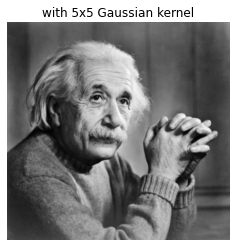

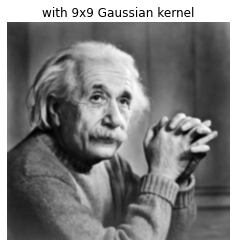

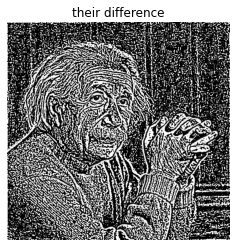

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import numpy as np

my_img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/einstein_test_img.jpg", 0)

blur55 = cv2.GaussianBlur(my_img, (5,5), 0)
plt.figure(),plt.imshow(blur55,cmap='gray'),plt.axis('off'),plt.title('with 5x5 Gaussian kernel')

blur99 = cv2.GaussianBlur(my_img, (9,9), 2)
plt.figure(),plt.imshow(blur99,cmap='gray'),plt.axis('off'),plt.title('with 9x9 Gaussian kernel')

plt.figure(),plt.imshow(blur99-blur55,cmap='gray'),plt.axis('off'),plt.title('their difference')
plt.show()

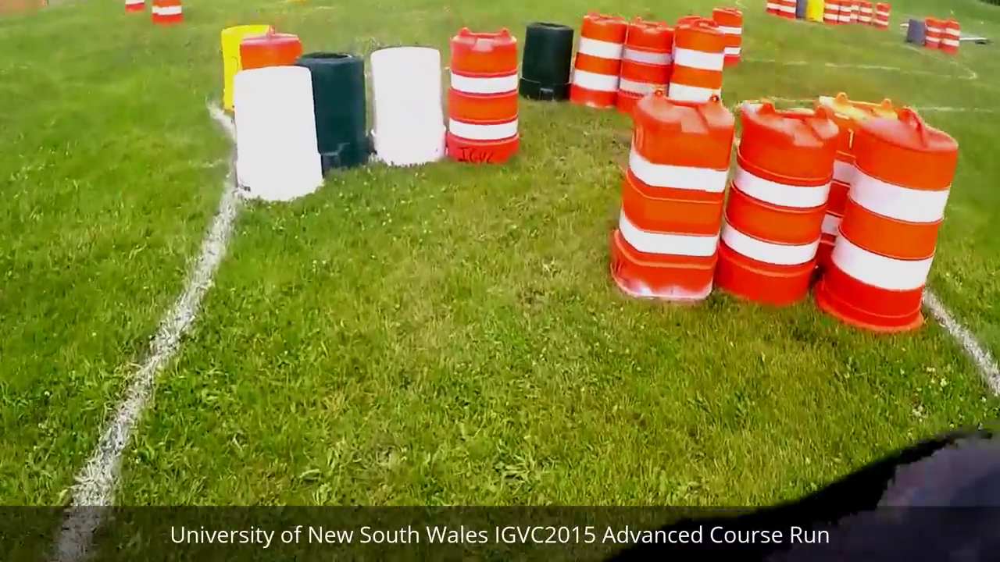

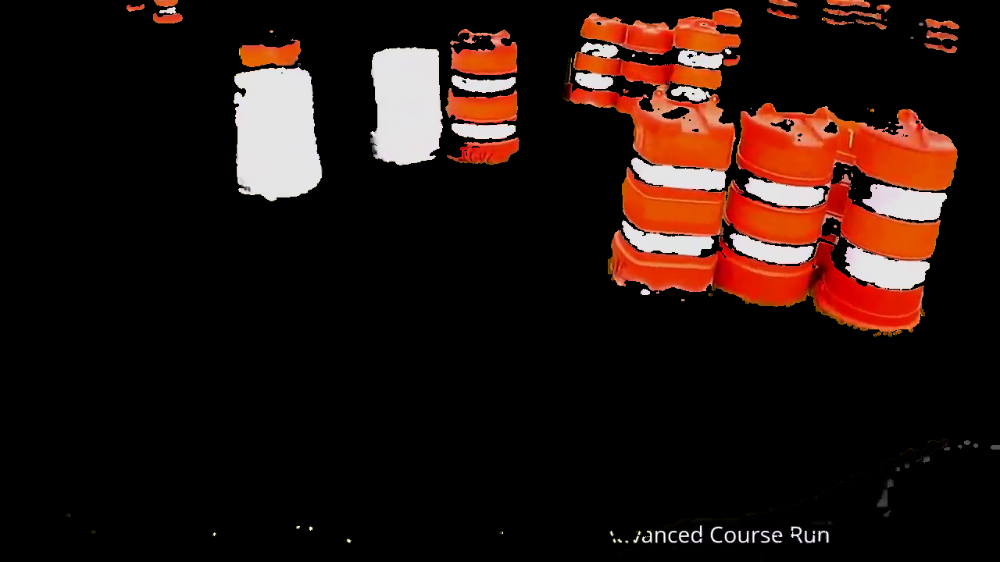

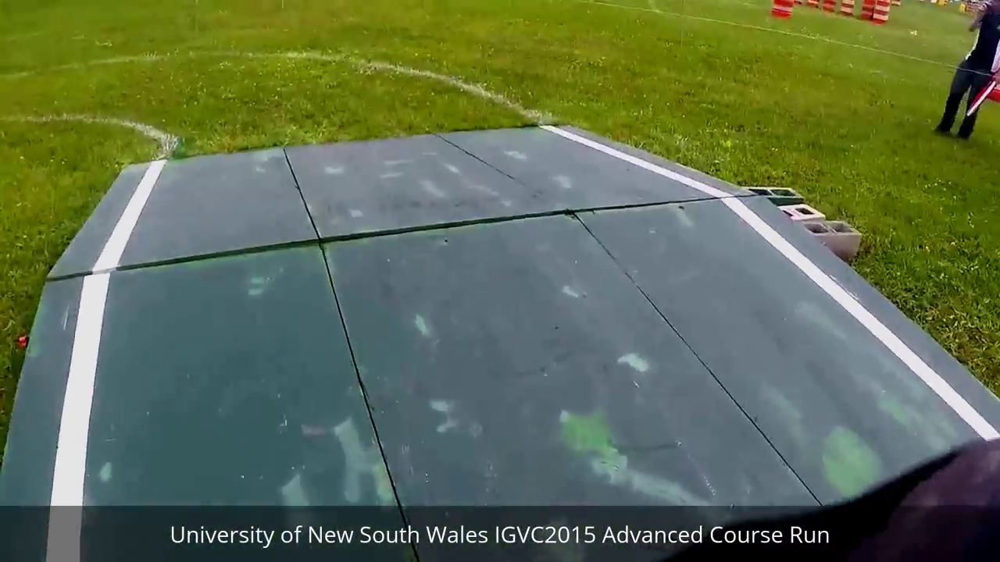

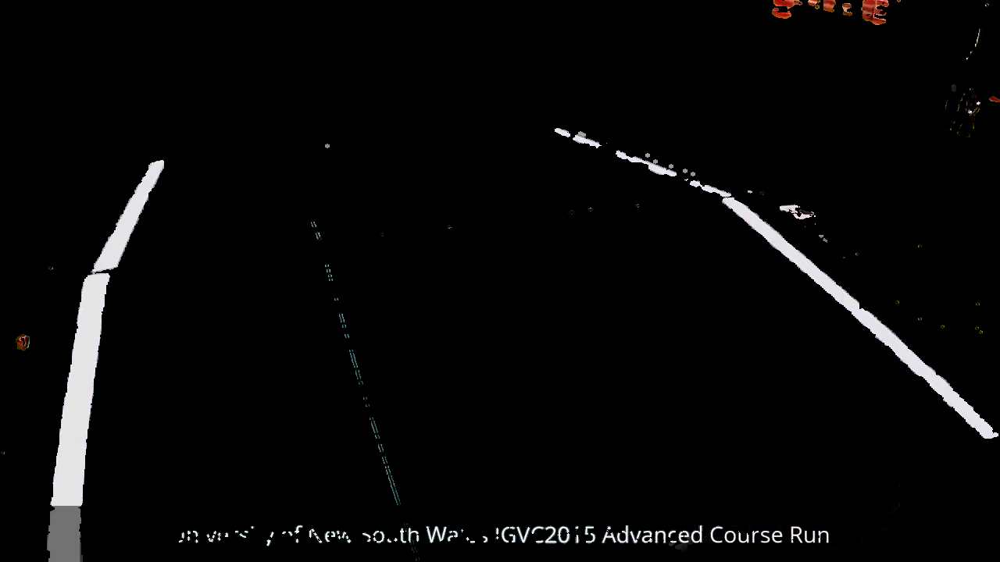

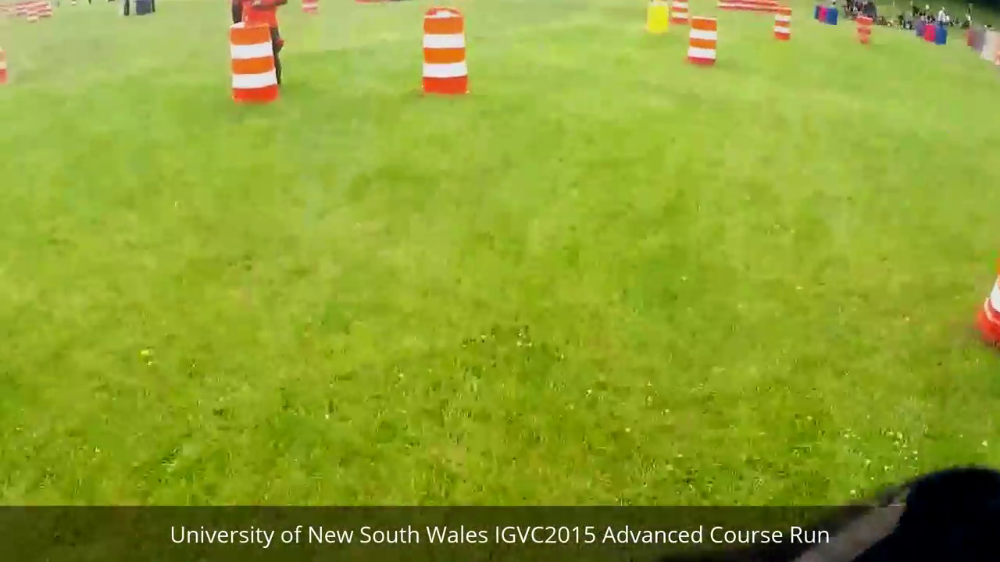

...

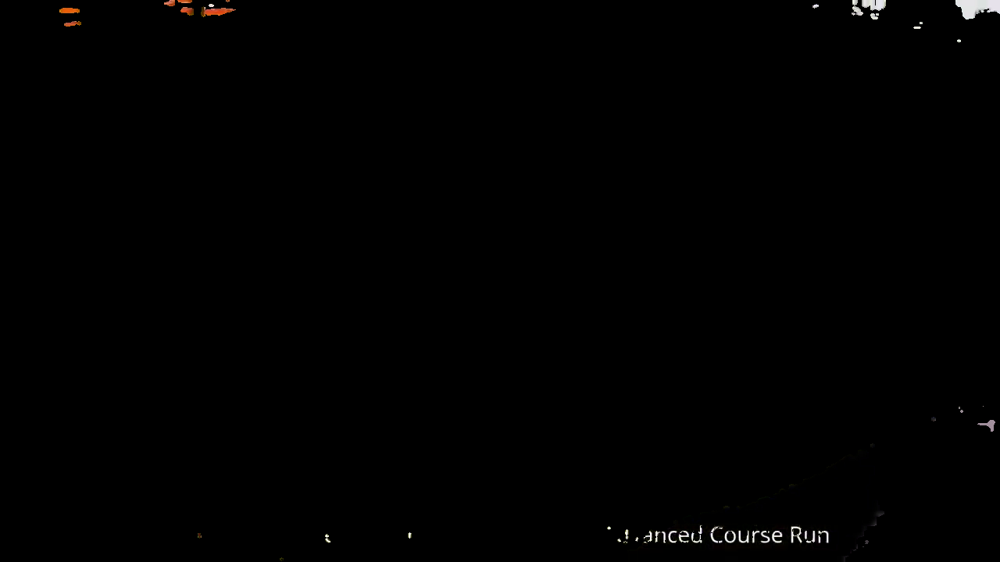

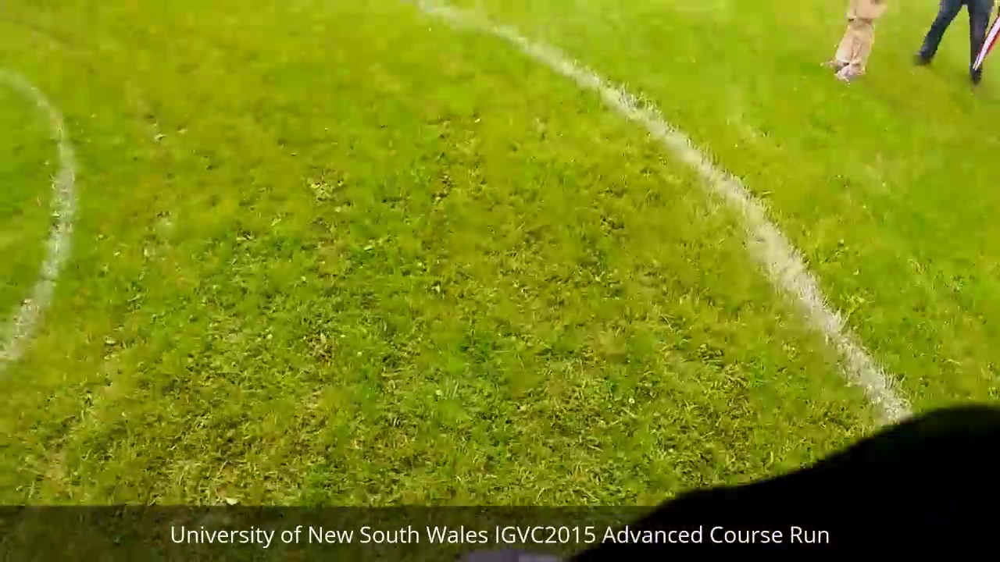

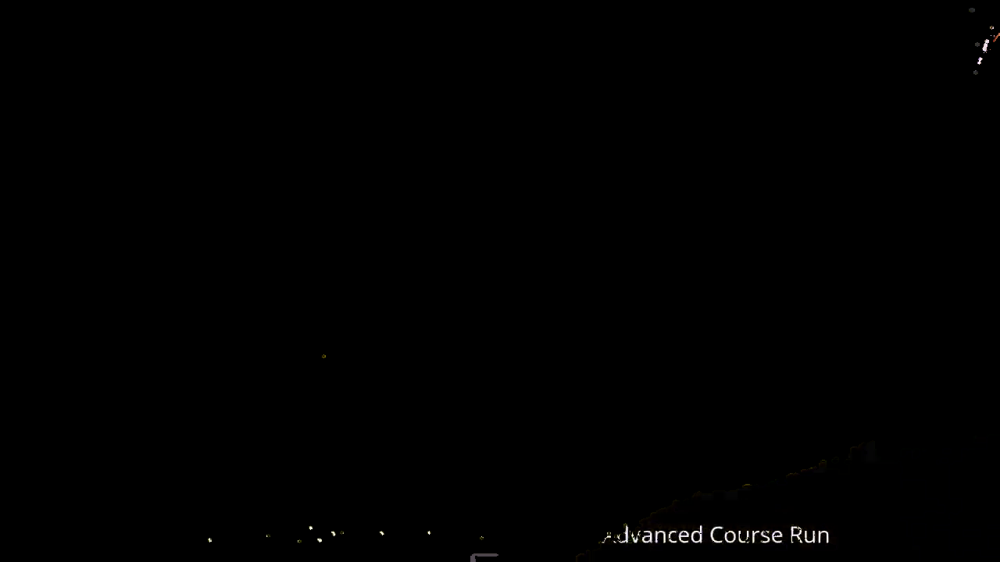

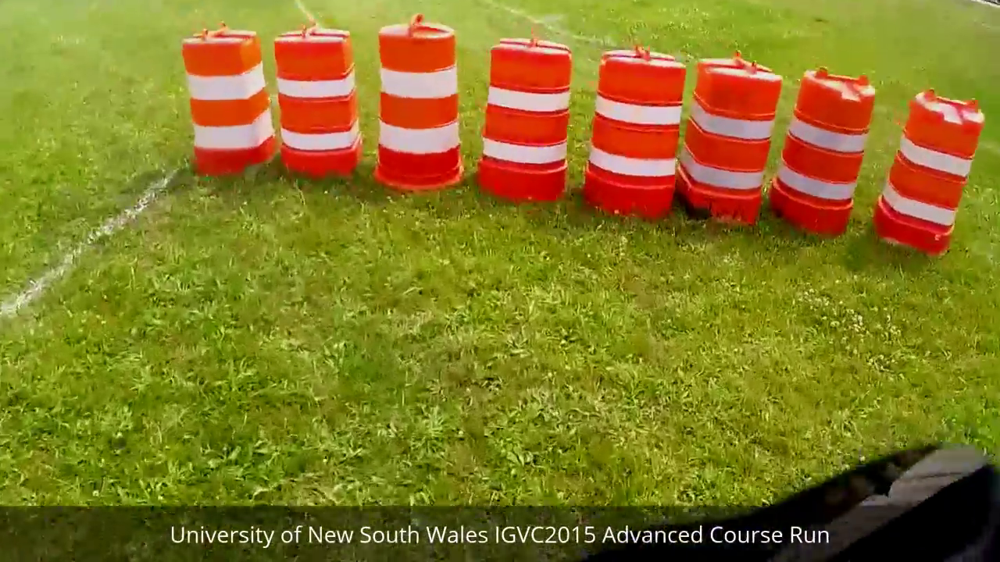

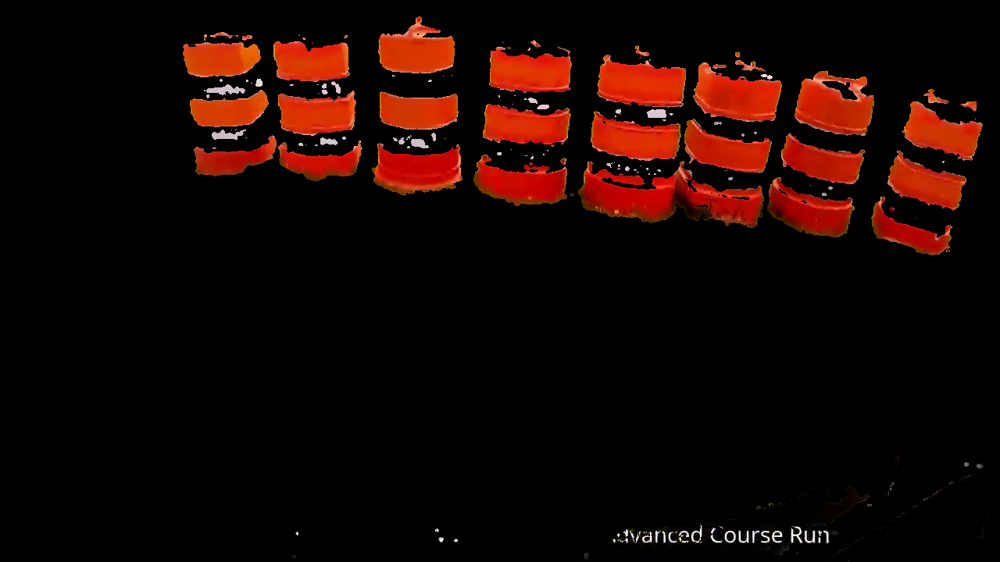

This seems to be the end of video!
Done!


In [31]:
import cv2
import cv2 as cv
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import numpy as np

barrel = cv2.imread("/content/drive/MyDrive/Colab Notebooks/orange_white_barrel4.jpg")
barrel = cv2.resize(barrel, (1280,720)) # Matching to frame image size

barrel_hsv = cv2.cvtColor(barrel,cv2.COLOR_BGR2HSV) # will be using for template matching
barrel_hist = cv2.calcHist([barrel_hsv],[0, 1], None, [180, 256], [0, 180, 0, 256] )
cv2.normalize(barrel_hist,barrel_hist,0,255,cv2.NORM_MINMAX)

video_path = "/content/drive/MyDrive/Colab Notebooks/IGVC 2015 UNSW Advanced Course GoPro - Speed Record.mp4"
cap = cv2.VideoCapture(video_path)
c=1
while(1):
    # Reading one frame
    ret, frame = cap.read()

    if not ret:
      print("This seems to be the end of video!")
      break

    # Convert BGR to HSV
    hsv_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
      
    res = cv2.calcBackProject([hsv_frame],[0,1],barrel_hist,[0,180,0,256],1)     

    # convolve with a circular disc
    disc = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    cv2.filter2D(res, -1, disc, res) 

    # thresholding the image
    _,thresh = cv2.threshold(res,10,255,0)

    final = cv2.merge((thresh,thresh,thresh))
    result = cv2.bitwise_and(frame,final)

    # Showing results for every 800th video frames
    if c%800==0:
      cv2_imshow(frame)
      cv2_imshow(result)
    c=c+1
print("Done!")